<a href="https://colab.research.google.com/github/Ragnavald/PDI-Processamento-Digital-de-Imagem/blob/dev/PDI_LAB1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Grupo 8

**Ronaldo Ávila de Arruda Junior RA: 11202231908**

**Leonardo Garcia dos Santos RA: 11202230441**

Importação das dependências

In [18]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow # for image display
from google.colab import drive
from skimage import io
from PIL import Image
import matplotlib.pylab as plt
import requests

print("np:",np.__version__)
print("cv2:",cv2.__version__)
print("plt:",plt.__version__)

np: 2.4.2
cv2: 4.13.0
plt: 2.4.2


# 01

Fazendo downloads das imagens

In [19]:
urls = [
    'https://drive.google.com/uc?export=download&id=1YzbVD1jUANS0Ckv6FWpSj8Ca0qOhXGQ0',
    'https://drive.google.com/uc?export=download&id=1L6nMYVQFE0g5zkUXvoc_pQwf-6KGyC3u',
    'https://drive.google.com/uc?export=download&id=1rGQTB7RE__ToZS0BMMpVvHF35B2bCEL6'
]

In [20]:
response = requests.get(urls[0])
numImages = 3;
originalImages = [None] * numImages

for i, url in enumerate(urls):
    response = requests.get(url)
    img_array = np.asarray(bytearray(response.content), dtype=np.uint8)
    originalImages[i] = cv2.imdecode(img_array, cv2.IMREAD_COLOR)

Conversão para imagem BGR (RGB) para GRAY(cinza) para calcular o histograma original e o histograma equalizado (reedistribuição da intensidade das imagens, de forma a aumentar o contraste)

Imagem original


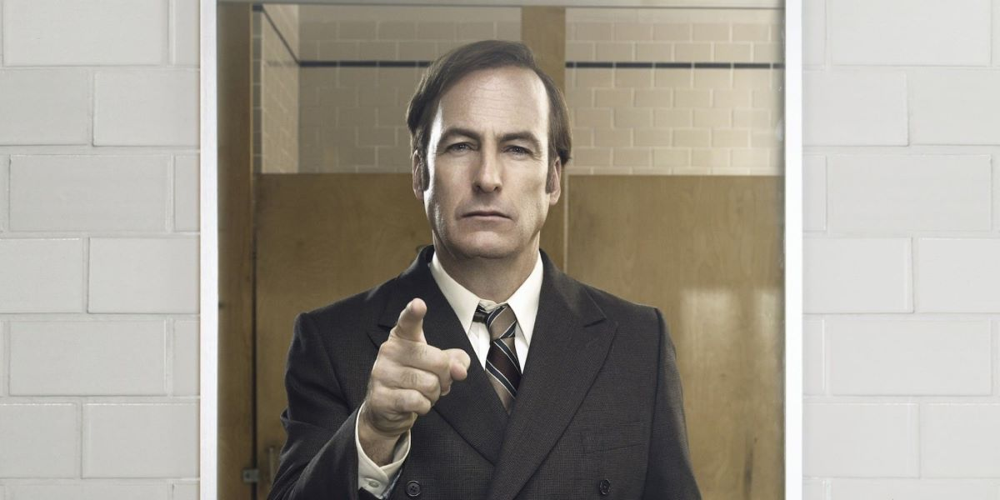

Imagem em tons de cinza


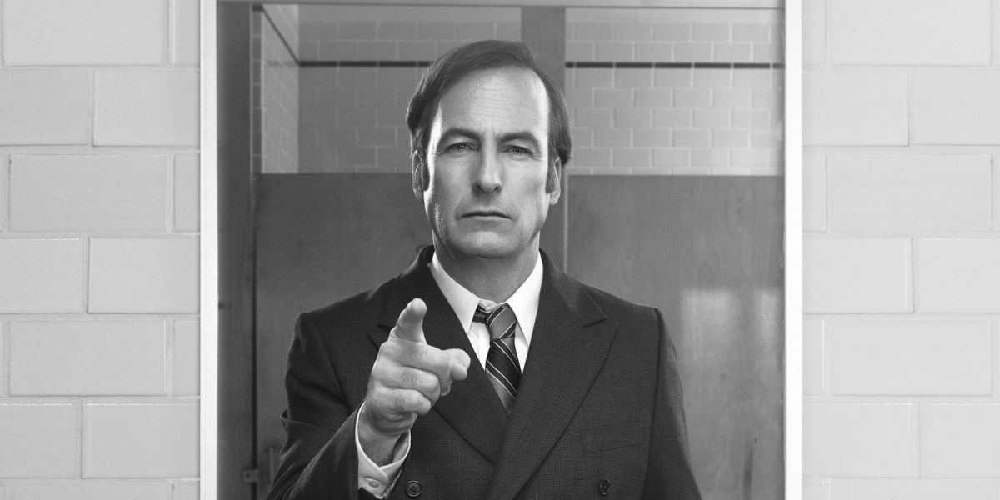

Imagem equalizada


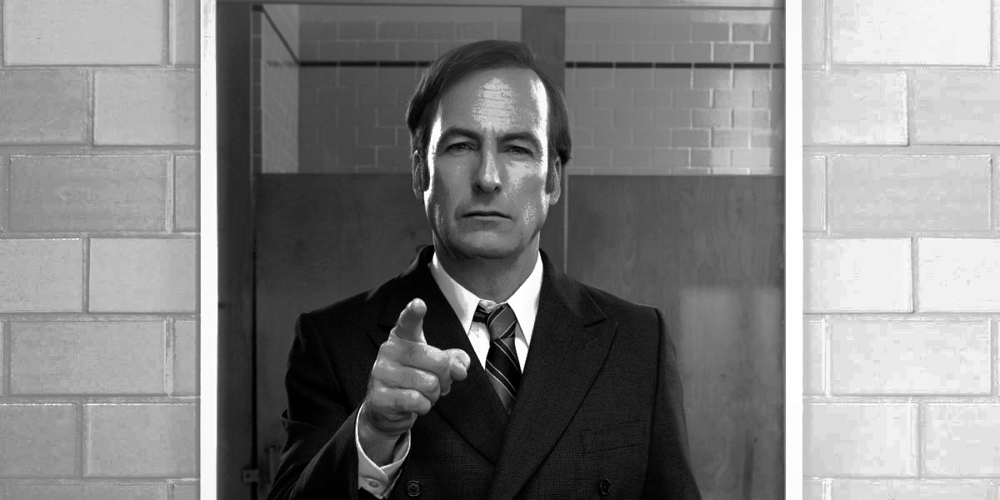

Histogramas


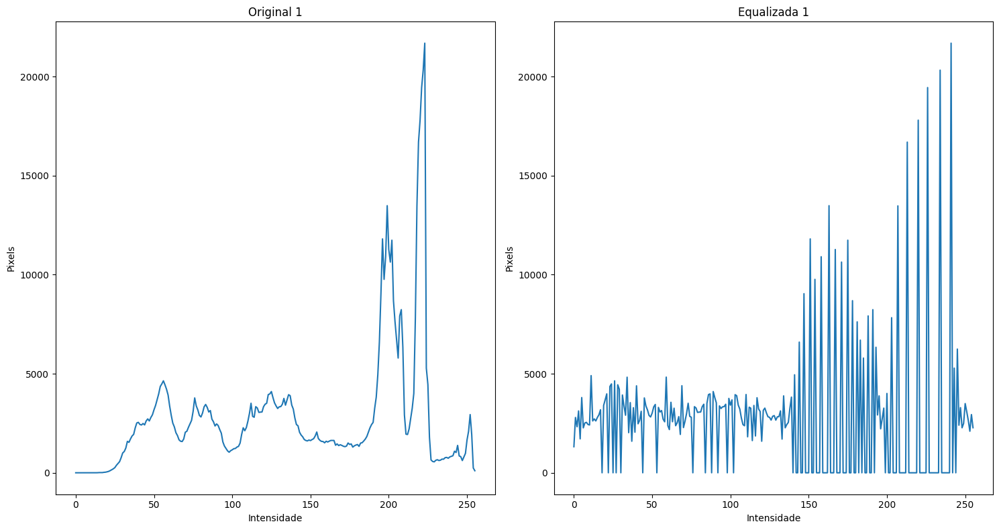



Imagem original


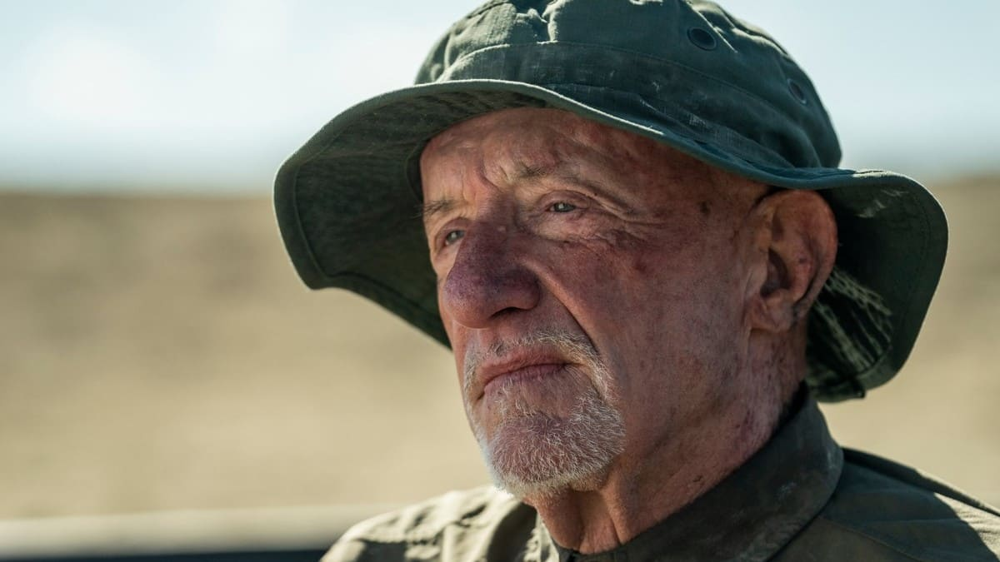

Imagem em tons de cinza


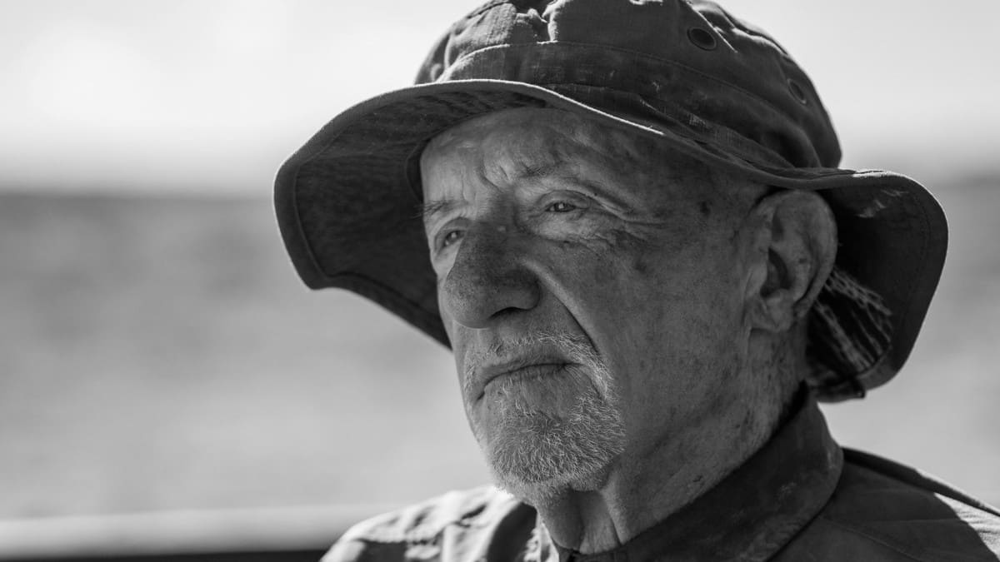

Imagem equalizada


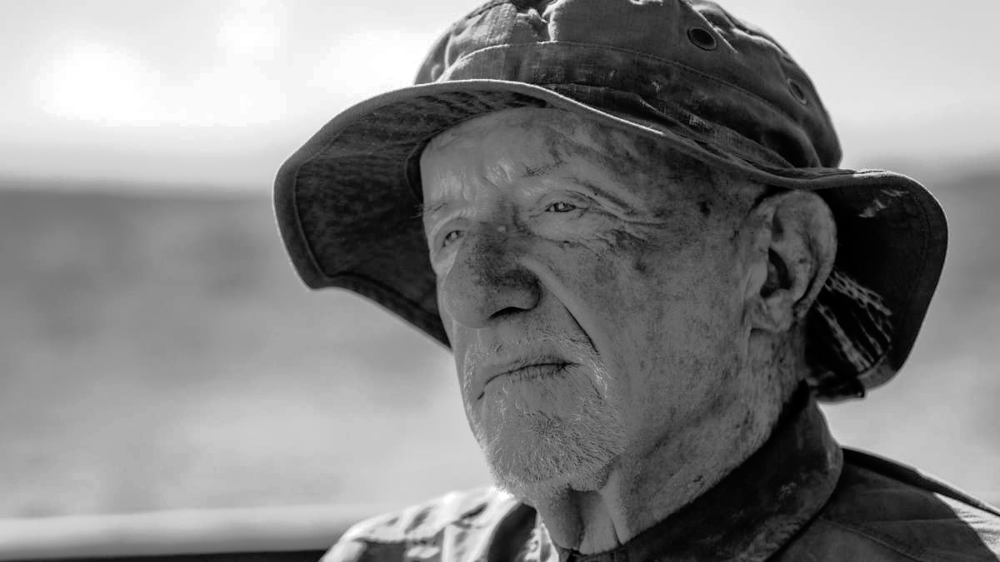

Histogramas


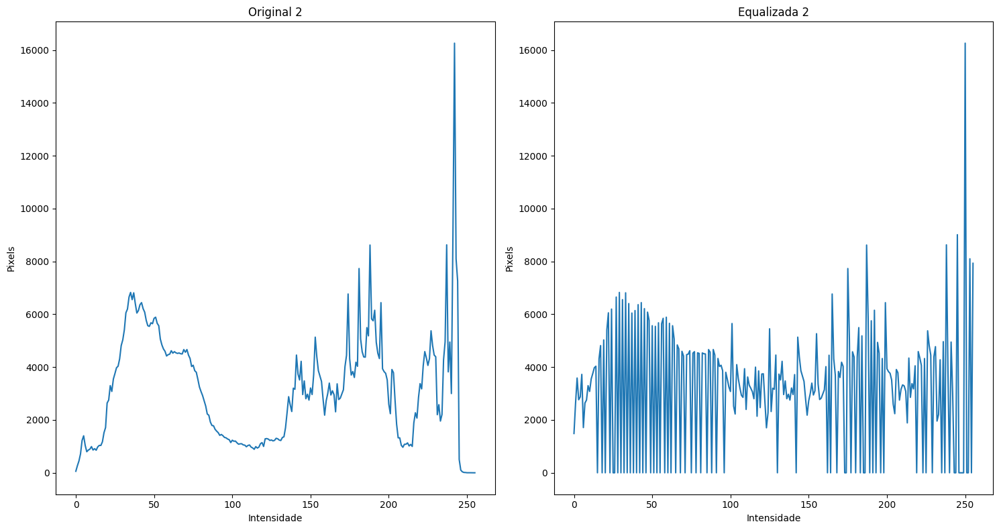



Imagem original


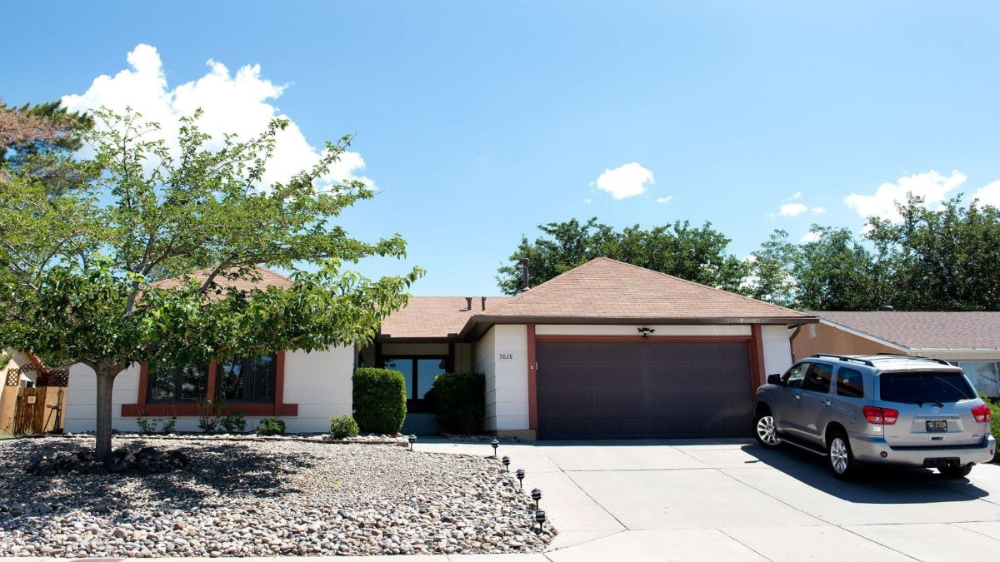

Imagem em tons de cinza


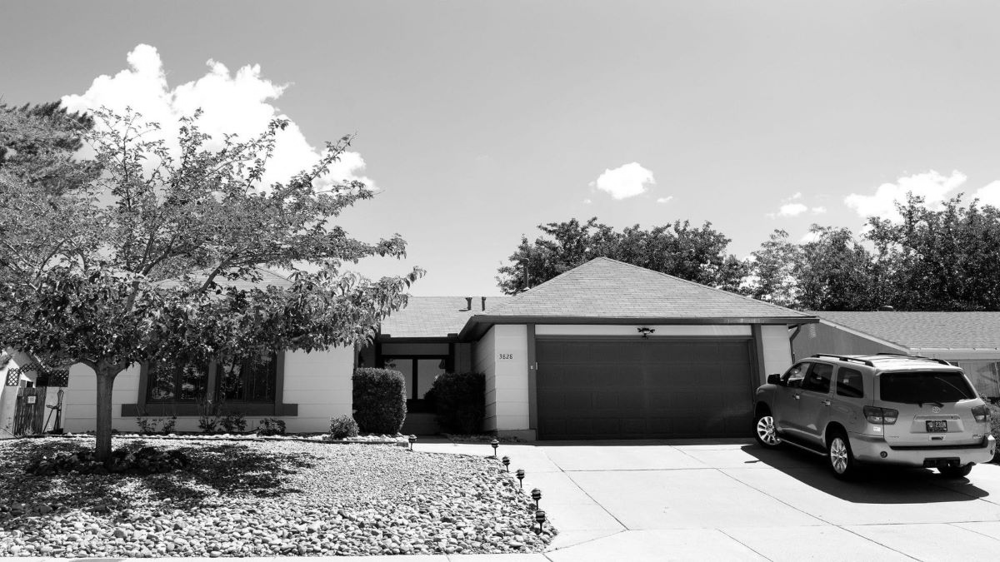

Imagem equalizada


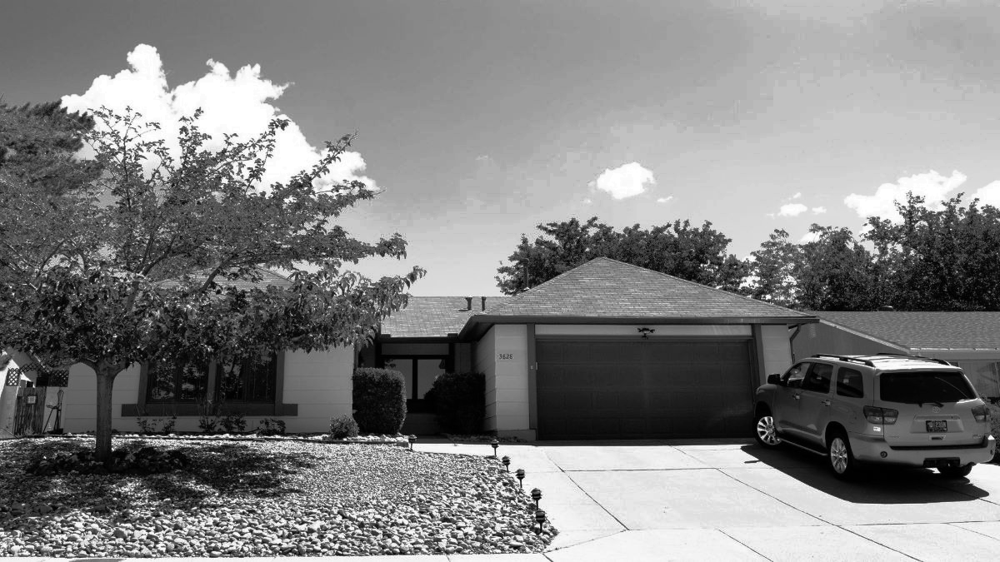

Histogramas


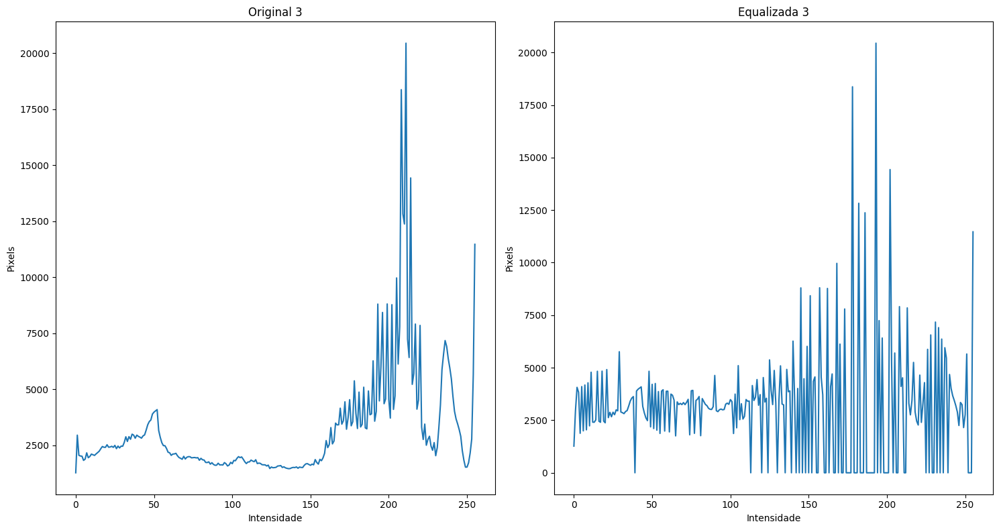

In [31]:
for i,img in enumerate(originalImages):
  grayImage = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  originalHist = cv2.calcHist([grayImage], [0], None, [256], [0, 256])
  equalizedImage = cv2.equalizeHist(grayImage)
  equalizedHist = cv2.calcHist([equalizedImage], [0], None, [256], [0, 256])

  print("Imagem original")
  cv2_imshow(img)
  print("Imagem em tons de cinza")
  cv2_imshow(grayImage)
  print("Imagem equalizada")
  cv2_imshow(equalizedImage)
  print("Histogramas")

  plt.figure(figsize=(15, 8))
  plt.subplot(1, 2, 1)
  plt.plot(originalHist)
  plt.title(f"Original {i+1}")
  plt.xlabel("Intensidade")
  plt.ylabel("Pixels")

  plt.subplot(1, 2, 2)
  plt.plot(equalizedHist)
  plt.title(f"Equalizada {i+1}")
  plt.xlabel("Intensidade")
  plt.ylabel("Pixels")
  plt.tight_layout()
  plt.show()
  print("\n")



# 2

Cálculo dos histogramas originais e equalizados para cada canal RGB e junção dos canais eequalizados para imagem resultante.

Imagem original


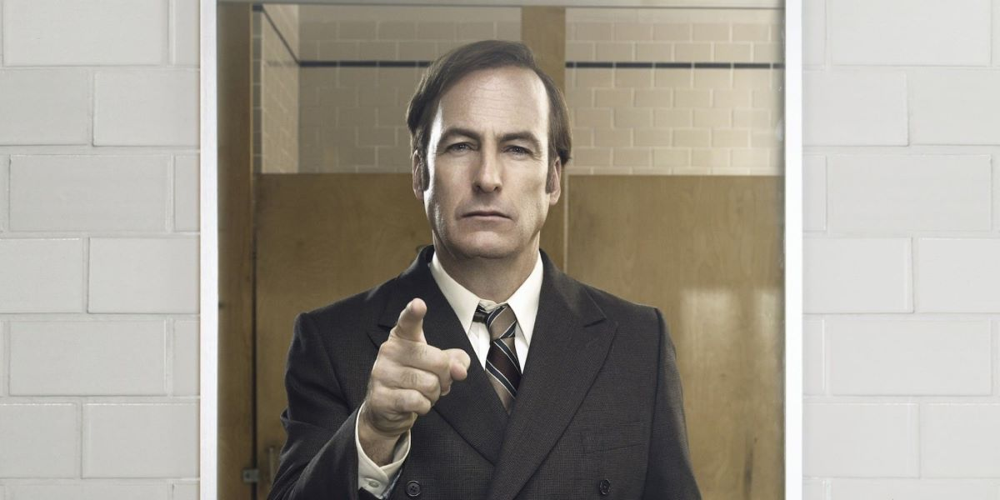

Imagem equalizada


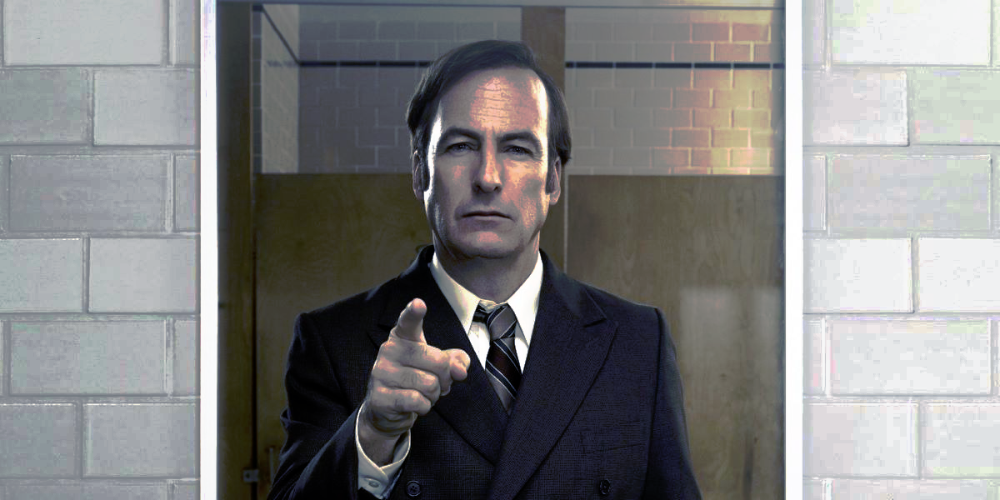

Histogramas


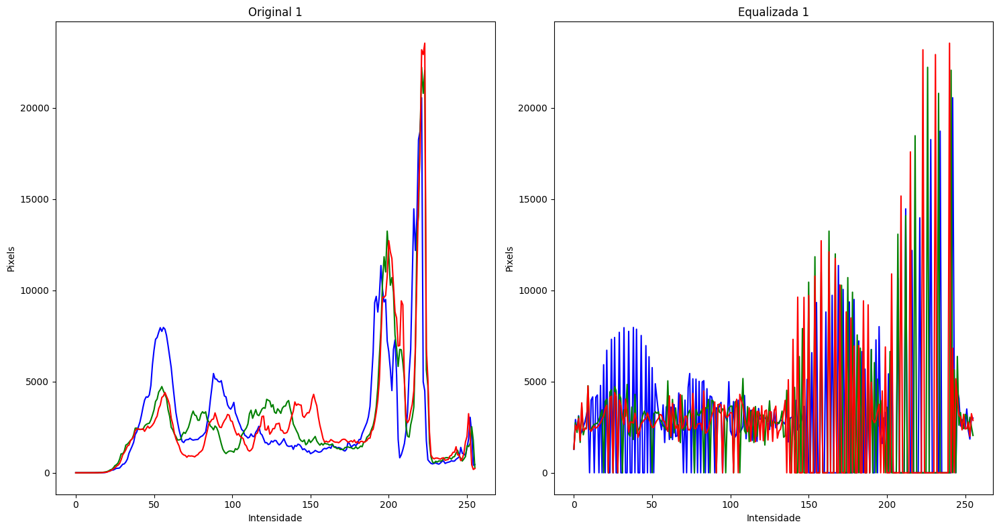


Imagem original


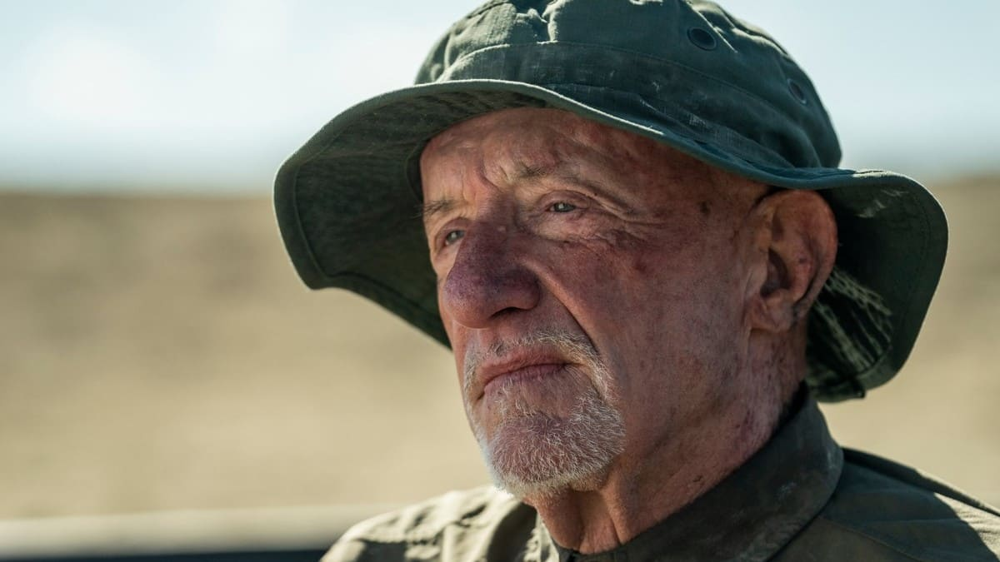

Imagem equalizada


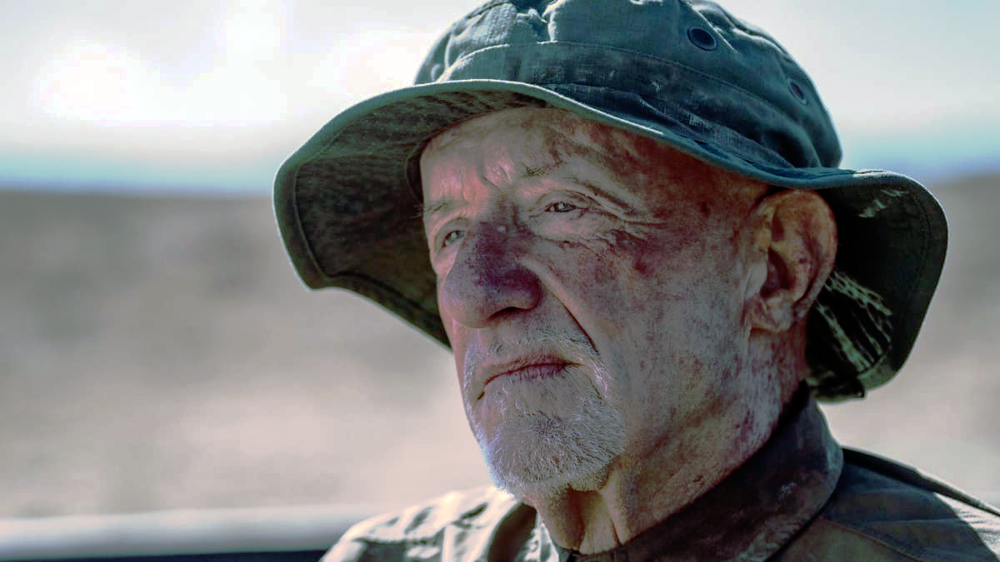

Histogramas


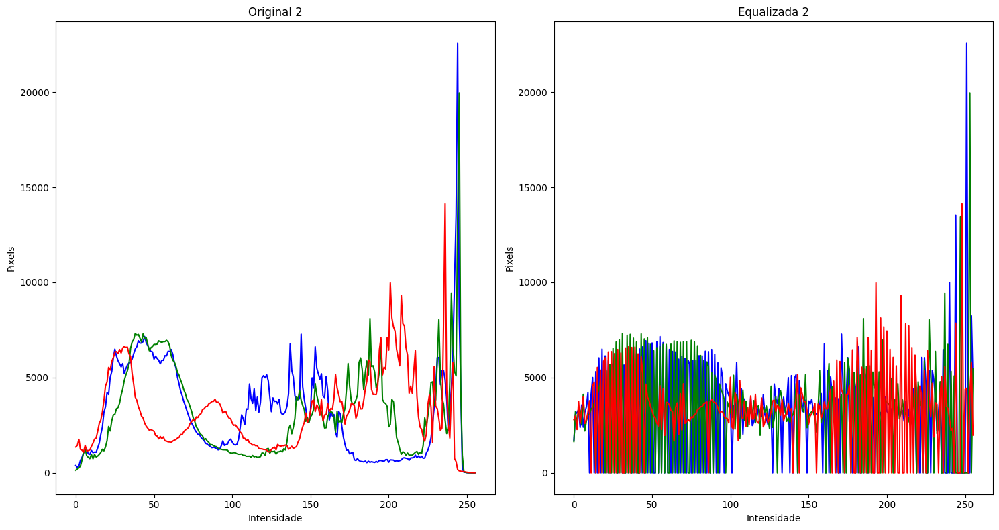


Imagem original


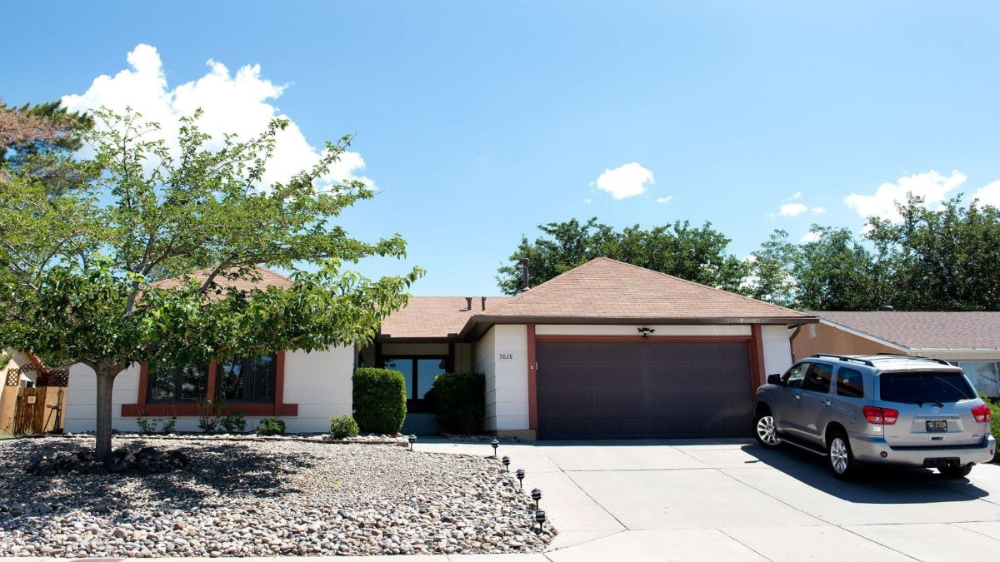

Imagem equalizada


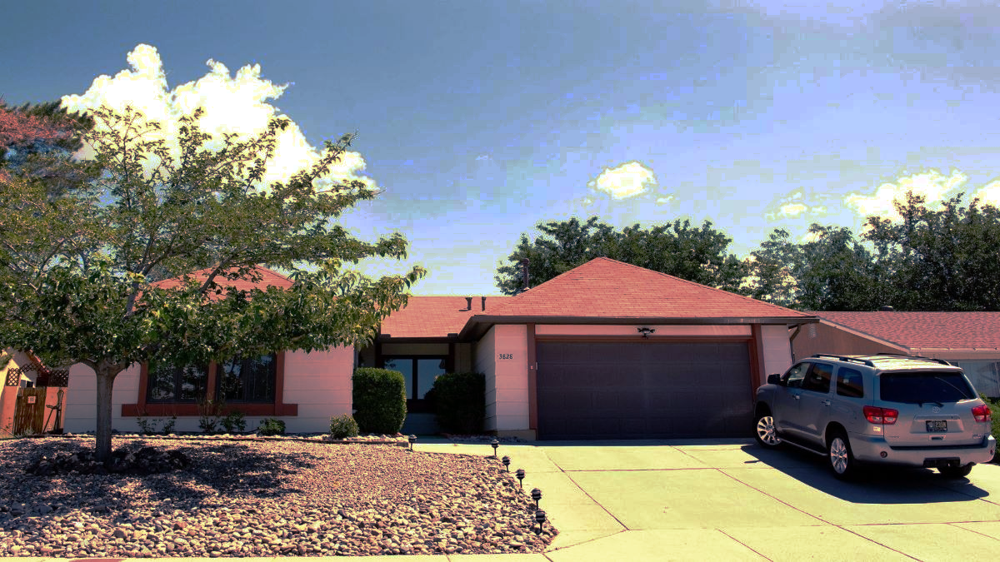

Histogramas


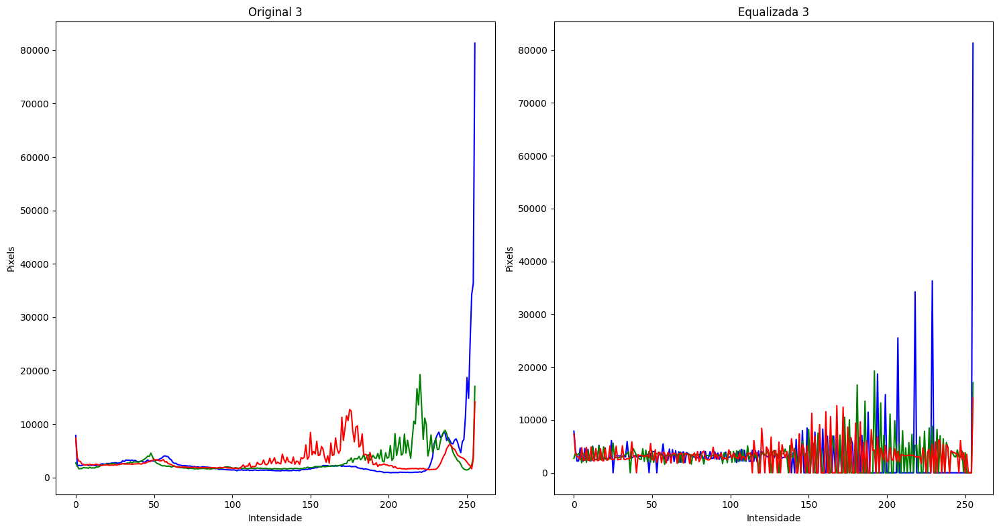

In [33]:
for i, img in enumerate(originalImages):
  b, g, r = cv2.split(img)
  b_eq = cv2.equalizeHist(b)
  g_eq = cv2.equalizeHist(g)
  r_eq = cv2.equalizeHist(r)
  eq_img = cv2.merge((b_eq, g_eq, r_eq))

  print("Imagem original")
  cv2_imshow(img)
  print("Imagem equalizada")
  cv2_imshow(eq_img)
  print("Histogramas")

  plt.figure(figsize=(15, 8))
  b_hist_original = cv2.calcHist([b], [0], None, [256], [0, 256])
  g_hist_original = cv2.calcHist([g], [0], None, [256], [0, 256])
  r_hist_original = cv2.calcHist([r], [0], None, [256], [0, 256])

  plt.subplot(1, 2, 1)
  plt.plot(b_hist_original, color='b')
  plt.plot(g_hist_original, color='g')
  plt.plot(r_hist_original, color='r')
  plt.title(f"Original {i+1}")
  plt.xlabel("Intensidade")
  plt.ylabel("Pixels")

  b_hist_eq = cv2.calcHist([b_eq], [0], None, [256], [0, 256])
  g_hist_eq = cv2.calcHist([g_eq], [0], None, [256], [0, 256])
  r_hist_eq = cv2.calcHist([r_eq], [0], None, [256], [0, 256])

  plt.subplot(1, 2, 2)
  plt.plot(b_hist_eq, color='b')
  plt.plot(g_hist_eq, color='g')
  plt.plot(r_hist_eq, color='r')
  plt.title(f"Equalizada {i+1}")
  plt.xlabel("Intensidade")
  plt.ylabel("Pixels")
  plt.tight_layout()
  plt.show()
  print()